# EE386 Digital Signal Processing Lab

## Experiment 2

### Importing Libraries

In [5]:
import numpy as np
import IPython
import scipy
import math
from matplotlib import pyplot as plt
from matplotlib import style
from matplotlib import rcParams
import matplotlib
import pandas as pd
from scipy import signal as sp
from scipy.io import wavfile
%matplotlib inline

In [6]:
plt.style.use(['seaborn-deep'])
plt.rcParams.update({
    "font.serif": ["cm"],
    "mathtext.fontset": "cm",
    "figure.figsize": (12,6),
    "font.size": 8})

pi = np.pi

### Setting up the Value of alpha

$alpha = 1 + x$%$4$ where x is the last 3 digits of the registration number

In [7]:
# Roll number: 191EE114
alpha = 1 + 114 % 4  
print(alpha)

3


### Problem 1

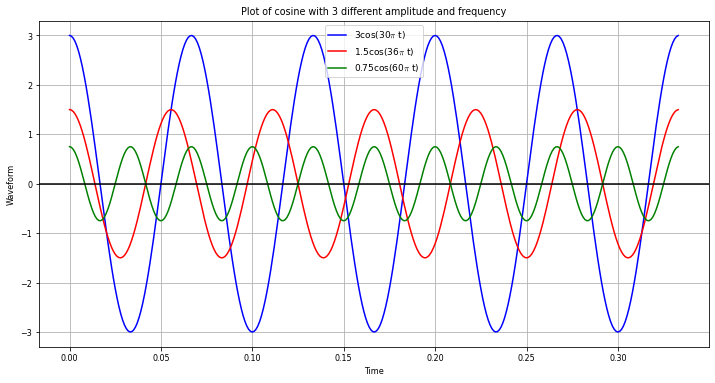

In [8]:
# Initializing Variables
maxTime = 1 / alpha
time = np.arange(0, maxTime, 0.001)

plt.figure()

## Waveform 1
frequency1 = 5 * alpha
w1 = 2 * pi * frequency1
amp1 = alpha
y1 =  amp1 * np.cos(w1 * time)
plt.plot(time, y1, label = "3cos(30$\pi$ t)", color="blue")

## Waveform 2
frequency2 = 6 * alpha
w2 = 2 * pi * frequency2
amp2 = alpha / 2.0
y2 = amp2 * np.cos(w2 * time)
plt.plot(time, y2, label = "1.5cos(36$\pi$ t)", color = "red")

## Waveform 3
frequency3 = 10 * alpha
w3 = 2 * pi * frequency3
amp3 = alpha / 4.0
y3 = amp3 * np.cos(w3 * time)
plt.plot(time, y3, label = "0.75cos(60$\pi$ t)", color = "green")

plt.title("Plot of cosine with 3 different amplitude and frequency")
plt.xlabel("Time")
plt.ylabel("Waveform")
plt.axhline(y = 0, color = "black")
plt.grid(True, which='both')
plt.legend(fontsize=9, loc='best')

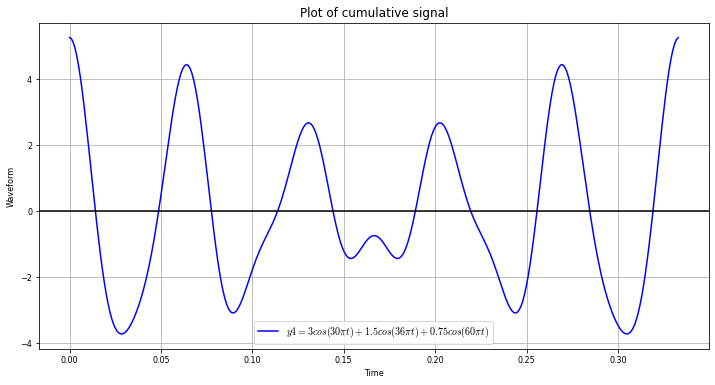

In [9]:
## Sum of All three functions
y4 = y1 + y2 + y3

plt.figure()

plt.plot(time, y4, label = "$y4 = 3cos(30\pi t) + 1.5cos(36\pi t) + 0.75cos(60\pi t)$", color="b")
plt.title("Plot of cumulative signal", fontsize=12)
plt.xlabel("Time")
plt.ylabel("Waveform")
plt.axhline(y = 0, color = "black")
plt.grid(True, which='both')
plt.legend(fontsize=10)

In [10]:
def sampleFrequency(title, factor, a, b, c, fig):
  # Sampling Information
  Fs = factor * alpha  # sampling rate
  T = 1/Fs # sampling period
  t = maxTime # seconds of sampling
  N = Fs*t # total points in signal
  sampled_time = np.arange(0, t, T)

  y1 =  amp1 * np.cos(w1 * sampled_time)
  y2 = amp2 * np.cos(w2 * sampled_time)
  y3 = amp3 * np.cos(w3 * sampled_time)

  y4 = y1 + y2 + y3
  fig.add_subplot(a, b, c)

  plt.stem(sampled_time, y4)
  plt.title("Cumulative signal sampled at " + title + " samples/second", fontsize=12)
  plt.xlabel("Time")
  plt.ylabel("Waveform")
  plt.axhline(y = 0, color = "black")
  plt.grid(True, which='both')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  app.launch_new_instance()
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:16: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves

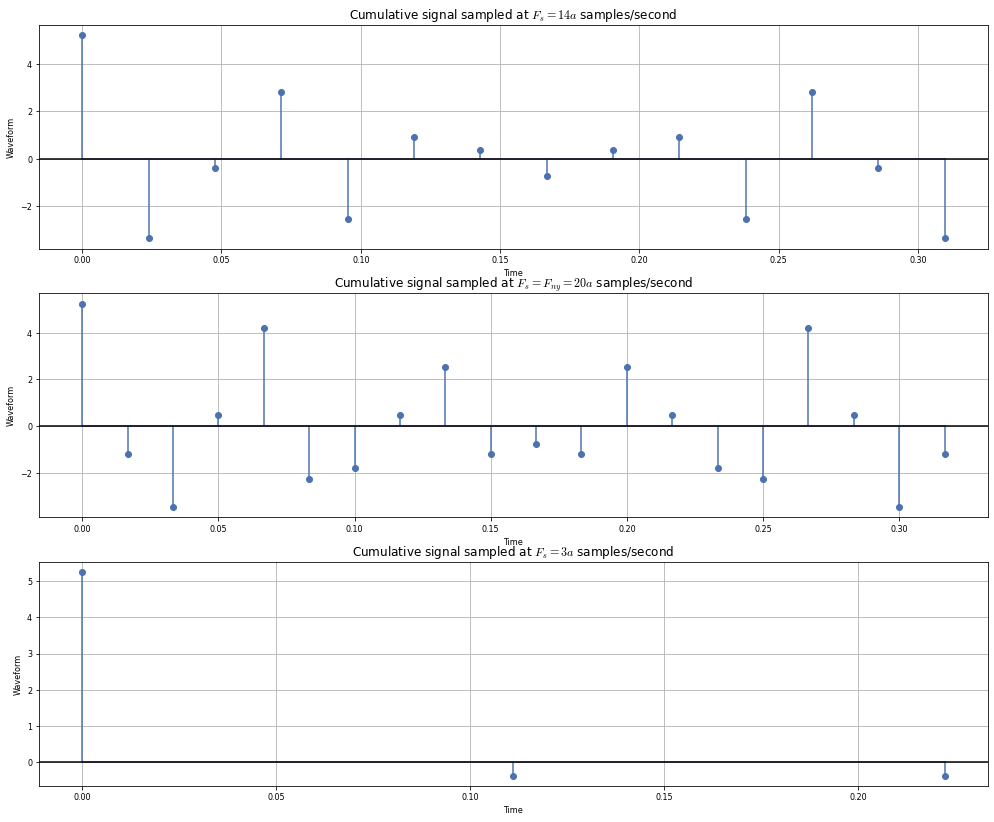

In [70]:
fig = plt.figure(figsize=(17, 14))

# 1.3.a
factor = 14   # Given in the question
sampleFrequency("$F_{s} = 14a$", factor, 3, 1, 1, fig)

# 1.3.b
factor = 20   # Nyquist frequency
sampleFrequency("$F_{s} = F_{ny} = 20a$", factor, 3, 1, 2, fig)

# 1.3.c
factor = 3
sampleFrequency("$F_{s} = 3a$", factor, 3, 1, 3, fig)

In [12]:
def interpolatePlot(title, factor, a, b, c, fig):
  # Sampling Information
  Fs = factor * alpha  # sampling rate
  T = 1/Fs # sampling period
  t = maxTime # seconds of sampling
  N = Fs*t # total points in signal
  sampled_time = np.arange(0, t, T)
  time = np.arange(0, maxTime, 0.001)

  y1 =  amp1 * np.cos(w1 * time)
  y1s = amp1 * np.cos(w1 * sampled_time)

  y2 = amp2 * np.cos(w2 * time)
  y2s = amp2 * np.cos(w2 * sampled_time)

  y3 = amp3 * np.cos(w3 * time)
  y3s = amp3 * np.cos(w3 * sampled_time)

  y4 = y1 + y2 + y3
  y4s = y1s + y2s + y3s
  f = scipy.interpolate.interp1d(time, y4)
  fig.add_subplot(a, b, c)

  plt.plot(time, y4, "blue", sampled_time, f(sampled_time), '--r')
  plt.title("Linear Interpolate plot of cumulative signal sampled at " + title + " samples/second", fontsize=12)
  plt.xlabel("Time")
  plt.ylabel("Waveform")
  plt.axhline(y = 0, color = "black")
  plt.grid(True, which='both')

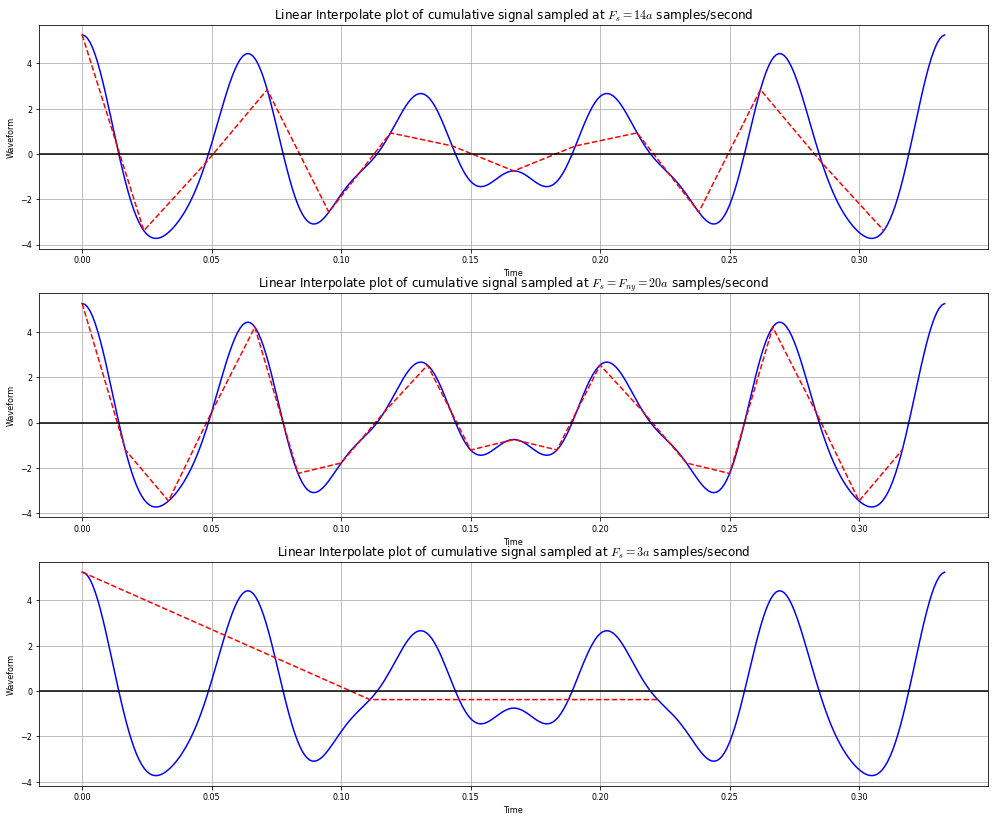

In [71]:
fig = plt.figure(figsize=(17, 14))

# 1.3.a
factor = 14   # Given in the question
interpolatePlot("$F_{s} = 14a$", factor, 3, 1, 1, fig)

# 1.3.b
factor = 20   # Nyquist frequency
interpolatePlot("$F_{s} = F_{ny} = 20a$", factor, 3, 1, 2, fig)

# 1.3.c
factor = 3
interpolatePlot("$F_{s} = 3a$", factor, 3, 1, 3, fig)

In [72]:
t_vec = np.arange(0,1/alpha,0.01)
sampled_signal_1 ,n_vec_1 = sample(14*alpha, t_vec)
sampled_signal_2 ,n_vec_2 = sample(2*10*alpha, t_vec)
sampled_signal_3 ,n_vec_3 = sample(3*alpha, t_vec)

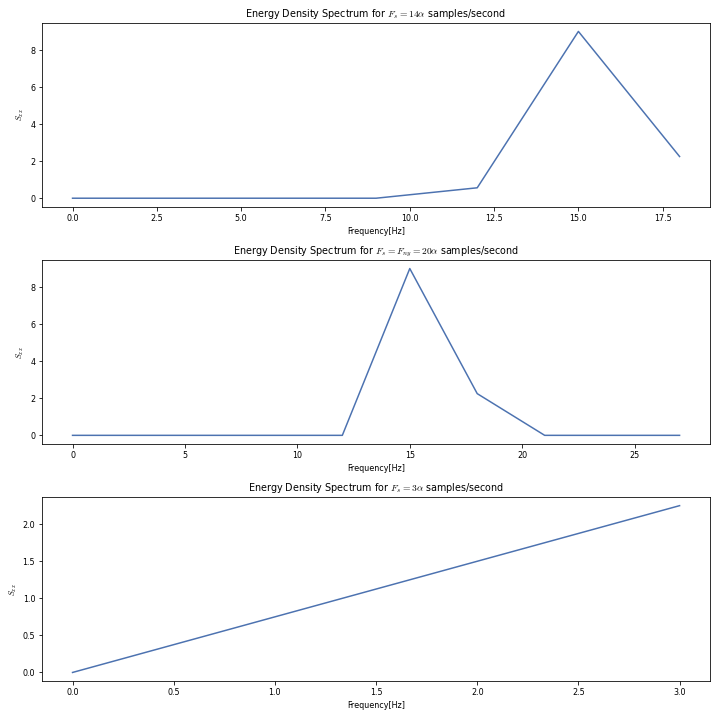

In [73]:
fourier_1 = np.fft.fft(sampled_signal_1)[0:int(len(sampled_signal_1)/2)]/len(sampled_signal_1)
fourier_1[1:] = 2*fourier_1[1:]
Sxx_1 = np.abs(fourier_1)**2
f_1 = 14*alpha*np.arange(len(sampled_signal_1)/2)/len(sampled_signal_1)
plt.figure(figsize=(10,10))
plt.subplot(3,1,1)
plt.plot(f_1,Sxx_1)
plt.title(r"Energy Density Spectrum for $F_{s} = 14\alpha$ samples/second ")
plt.xlabel("Frequency[Hz]")
plt.ylabel(r"$S_{xx}$")

fourier_2 = np.fft.fft(sampled_signal_2)[0 : int(len(sampled_signal_2)/2)]/len(sampled_signal_2)
fourier_2[1:] = 2 * fourier_2[1:]
Sxx_2 = np.abs(fourier_2)**2
f_2 = 2*10*alpha * np.arange(len(sampled_signal_2)/2)/len(sampled_signal_2)

plt.subplot(3,1,2)
plt.plot(f_2, Sxx_2)
plt.title(r"Energy Density Spectrum for $F_{s} = F_{ny} = 20\alpha$ samples/second")
plt.xlabel("Frequency[Hz]")
plt.ylabel(r"$S_{xx}$")


fourier_3 = np.fft.fft(sampled_signal_3)[0: int(len(sampled_signal_3)/2)]/len(sampled_signal_3)
fourier_3[1:] = 2*fourier_3[1:]
Sxx_3 = np.abs(fourier_3)**2
Sxx_3 = np.hstack((0, Sxx_3))
f_3 = 3*alpha* np.arange(len(sampled_signal_3)/2)/len(sampled_signal_3)
plt.subplot(3,1,3)
plt.plot(f_3, Sxx_3)
plt.title(r"Energy Density Spectrum for $F_{s} = 3\alpha$ samples/second")
plt.xlabel("Frequency[Hz]")
plt.ylabel(r"$S_{xx}$")


plt.tight_layout()
plt.savefig("Q1_5")
plt.show()


### Problem 2

In [32]:
# Generate Signals of Different sampling rates
def genereateTones(Fs):
  signal_freqeuncy = {
      'f_Do' : 440.00,
      'f_Re' : 493.88,
      'f_Mi' : 554.37,
      'f_Fa' : 587.33,
      'f_Ao' : 659.25,
      'f_La' : 739.99,
      'f_Ti' : 830.61,
      'f_Do' : 880.00
  }
  sampled_time = np.arange(0, 1, 1/Fs)
  signal = []
  for key in signal_freqeuncy:
    signal.append(np.sin(2*pi*signal_freqeuncy[key]*sampled_time))
  signal = tuple(signal)
  A_major = 32767.0 * np.hstack(signal)
  return A_major

In [39]:
# Sample Frequency = 44100
Fs = 44100
A_major = genereateTones(Fs)
A1 = A_major
IPython.display.Audio(A_major, rate = Fs)

In [40]:
wavfile.write("A_Major_Scale_44100.wav", 44100, A_major.astype(np.int16))

In [41]:
# Sample Frequency = 3000
Fs = 3000
A_major = genereateTones(Fs)
A2 = A_major
IPython.display.Audio(A_major, rate = Fs)

In [42]:
wavfile.write("A_Major_Scale_3000.wav", 3000, A_major.astype(np.int16))

In [43]:
# Sample Frequency = 22000
Fs = 22000
A_major = genereateTones(Fs)
A3 = A_major
IPython.display.Audio(A_major, rate = Fs)

In [45]:
wavfile.write("A_Major_Scale_22000.wav", 22000, A_major.astype(np.int16))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individu

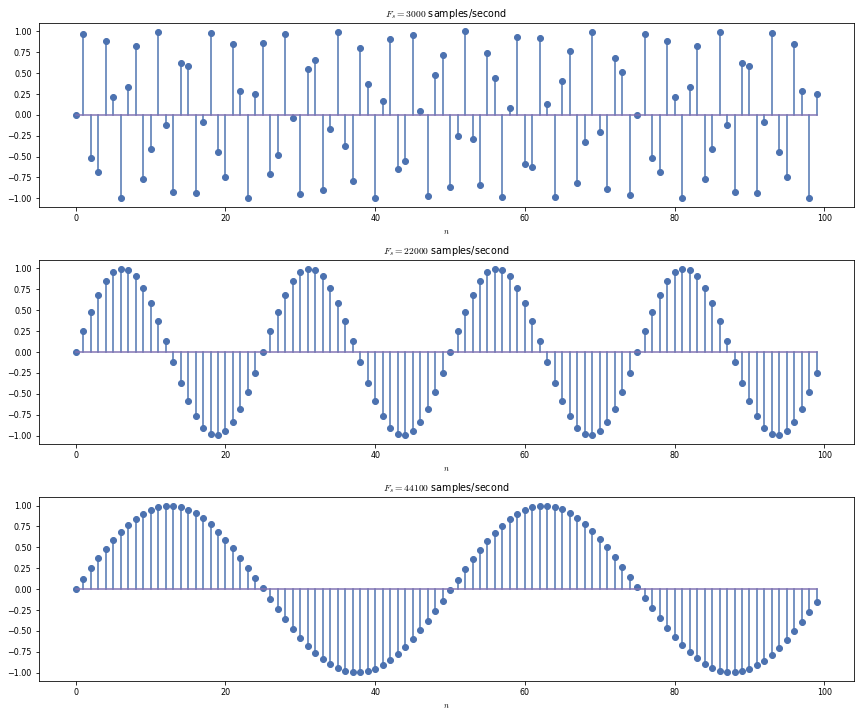

In [49]:
plt.figure(figsize= (12,10))
plt.subplot(3,1,1)
plt.stem(A2[0:100]/32767.0)
plt.xlabel("$n$")
plt.title("$F_{s} = 3000$ samples/second")
plt.subplot(3,1,2)
plt.stem(A3[0:100]/32767.0)
plt.xlabel("$n$")
plt.title("$F_{s} = 22000$ samples/second")
plt.subplot(3,1,3)
plt.stem(A1[0:100]/32767.0)
plt.xlabel("$n$")
plt.title("$F_{s} = 44100$ samples/second")
plt.tight_layout()
plt.savefig("Q2_1")

### Problem 3

In [51]:
Fs_1, track = wavfile.read("Track001.wav")
track = track/32767.0
IPython.display.Audio(track, rate =  Fs_1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: WavFileWarning: Reached EOF prematurely; finished at 1048576 bytes, expected 1623306 bytes from header.
  """Entry point for launching an IPython kernel.


In [52]:
n_1  = np.arange(1000, 1100)
track_2 = track[2*np.arange(int(len(track)/2))]
IPython.display.Audio(track_2, rate = Fs_1/2)

In [53]:
wavfile.write("track_24000.wav",int(Fs_1/2),(32767.0*track_2).astype(np.int16))

In [54]:
n_2 = np.arange(500, int(1100/2))
track_3 = track[3*np.arange(int(len(track)/3))]
IPython.display.Audio(track_3, rate = Fs_1/3)

In [55]:
wavfile.write("track_16000.wav",int(Fs_1/3),(32767.0*track_3).astype(np.int16))

In [56]:
n_3 = np.arange(int(1000/3),int(1100/3))
track_4 = track[4*np.arange(int(len(track)/4))]
IPython.display.Audio(track_4, rate = Fs_1/4)

In [57]:
wavfile.write("track_12000.wav",int(Fs_1/4),(32767.0*track_4).astype(np.int16))

In [58]:
n_4 = np.arange(int(1000/4) , int(1100/4))
track_5 = sp.resample(track, 2 * len(track))
IPython.display.Audio(track_5, rate = Fs_1 * 2)

In [59]:
wavfile.write("track_96000.wav",2*Fs_1,(32767.0*track_5).astype(np.int16))

In [60]:
n_5 = np.arange(2000 , 2200)
track_6= sp.resample(track, int(2.5*len(track)))
IPython.display.Audio(track_6, rate = int(Fs_1*2.5))

In [61]:
wavfile.write("track_120000.wav",int(2.5*Fs_1),(32767.0*track_6).astype(np.int16))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individu

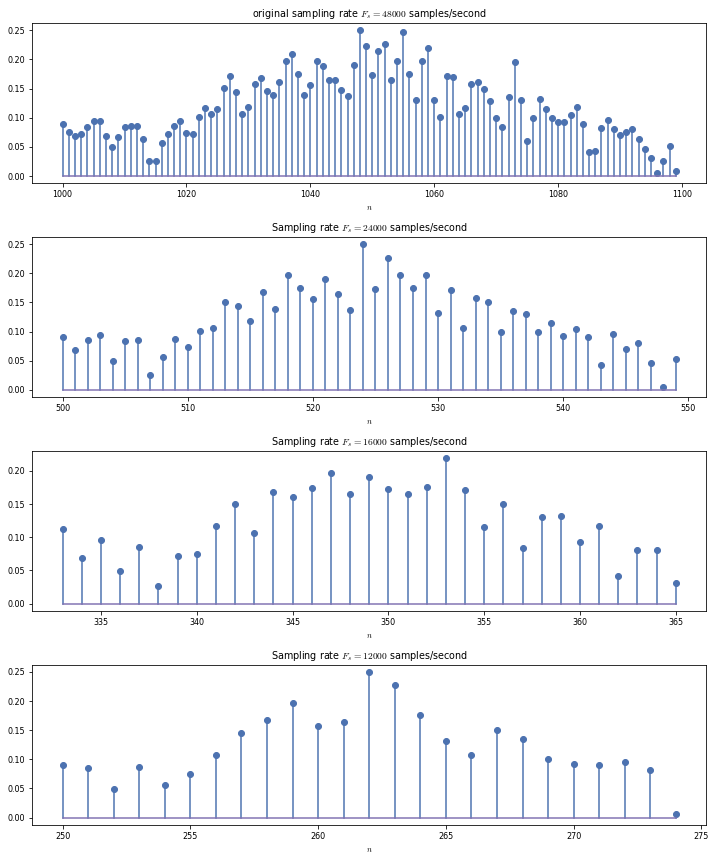

In [62]:
plt.figure(figsize= (10,12))
plt.subplot(4,1,1)
plt.stem(n_1,track[1000:1100])
plt.title("original sampling rate $F_{s} = 48000$ samples/second")
plt.xlabel("$n$")
plt.subplot(4,1,2)
plt.stem(n_2,track_2[500:int(1100/2)])
plt.title(r"Sampling rate $F_{s} = 24000$ samples/second")
plt.xlabel("$n$")
plt.subplot(4,1,3)
plt.stem(n_3,track_3[int(1000/3):int(1100/3)])
plt.title(r"Sampling rate $F_{s} = 16000$ samples/second")
plt.xlabel("$n$")
plt.subplot(4,1,4)
plt.stem(n_4,track_4[int(1000/4) : int(1100/4)])
plt.title(r"Sampling rate $F_{s} = 12000$ samples/second")
plt.xlabel("$n$")
plt.tight_layout()
plt.savefig("Q3_1")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:9: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  if __name__ == '__main__':


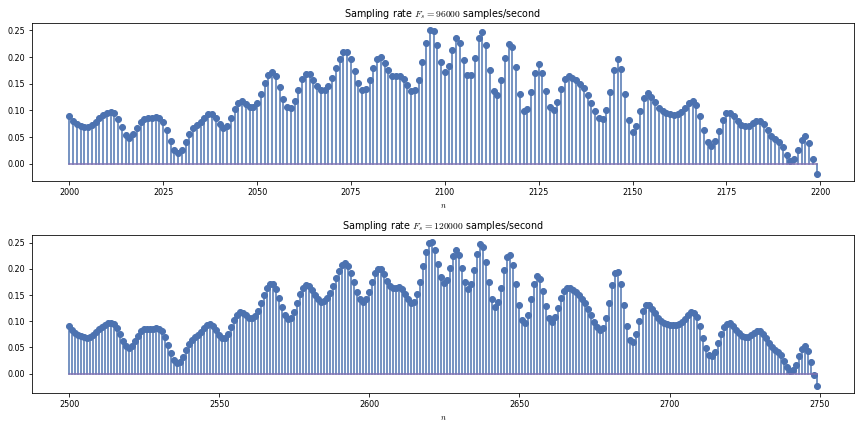

In [64]:
plt.figure(figsize=(12,6))
plt.subplot(2,1,1)
plt.stem(n_5, track_5[2000 : 2200])
plt.title(r"Sampling rate $F_{s} = 96000$ samples/second")
plt.xlabel("$n$")
plt.subplot(2,1,2)

n_6 = np.arange(2500 , 2750)
plt.stem(n_6,track_6[2500 : 2750])
plt.title(r"Sampling rate $F_{s} = 120000$ samples/second")
plt.xlabel("$n$")

plt.tight_layout()
plt.savefig("Q3_2")